<a href="https://colab.research.google.com/github/Erandi0011/Python/blob/main/Retina.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from skimage import color
import numpy as np
import numpy.matlib
import matplotlib.pyplot as plt

In [12]:
nfil = 60
ncol = 100
ncapa = 3
som = np.random.rand(nfil, ncol, ncapa)

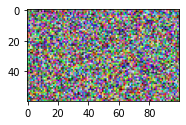

In [13]:
plt.ion()
plt.figure(1)
plt.subplot(1,2,1)
plt.imshow(som)
pat = np.random.rand(100, ncapa)
x = np.linspace(0, 100, ncol)
y = np.linspace(0, 100, nfil)
x, y  = np.meshgrid(x,y)
epocas = 10
alpha0 = 0.75
sgm0 = 20
decay = 0.05


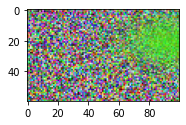

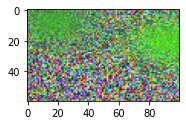

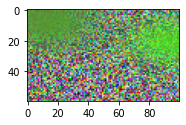

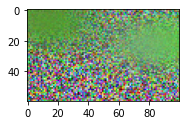

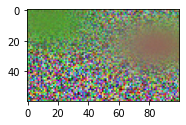

...

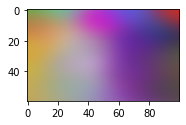

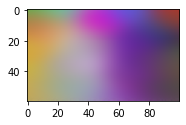

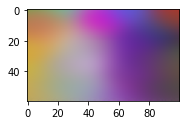

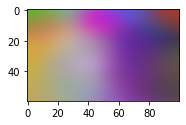

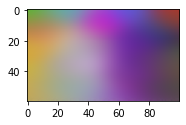

In [14]:
for t in range(epocas):
    alpha = alpha0*np.exp(-t*decay)
    sgm = sgm0*np.exp(-t*decay)
    ven = np.ceil(sgm*3)
    for i in range(100):
        vector = pat[i,:]
        columna = som.reshape(nfil*ncol, 3)
        d = 0
        for n in range(3):
            d = d + (vector[n]-columna[:,n])**2
        Distancia = np.sqrt(d)
        ind = np.argmin(Distancia)
        bmfil, bmcol = np.unravel_index(ind, [nfil, ncol])
        g = np.exp(-(((x-bmcol)**2)+((y-bmfil)**2))/(2*sgm*sgm))
        ffil = int(np.max([0, bmfil-ven]))
        tfil = int(np.max([bmfil+ven, nfil]))
        fcol = int(np.max([0, bmcol-ven]))
        tcol = int(np.max([bmcol+ven, ncol]))
        vecindad = som[ffil:tfil, fcol:tcol, :]
        T = np.ones(vecindad.shape)
        T[:,:,0] = T[:,:,0] * vector[0]
        T[:,:,1] = T[:,:,1] * vector[1]
        T[:,:,2] = T[:,:,2] * vector[2]
        G = np.ones(vecindad.shape)
        G[:,:,0] = g[ffil: tfil, fcol:tcol]
        G[:,:,1] = g[ffil: tfil, fcol:tcol]
        G[:,:,2] = g[ffil: tfil, fcol:tcol]
        vecindad = vecindad + (alpha*G*(T-vecindad))
        som[ffil:tfil, fcol:tcol, :] = vecindad
        plt.subplot(1,2,2)
        plt.imshow(som)
        plt.pause(0.5)
        plt.show()